# Introduction

# Part 1: Some Data is Meant to be Seen

## The Path to Insight

### Setup

In [9]:
import plotly.figure_factory as ff
import numpy as np
import plotly.graph_objects as go
import pandas as pd
from perlin_noise import PerlinNoise
import matplotlib.pyplot as plt

In [2]:

# Define grid size
size = 50

# Initialize Perlin Noise
noise = PerlinNoise(octaves=4, seed=42)

# Generate elevation data using Perlin noise
elevation = np.zeros((size, size))
for i in range(size):
    for j in range(size):
        elevation[i, j] = noise([i / size, j / size])

# Normalize elevation values to range 0-100
elevation = (elevation - np.min(elevation)) / (np.max(elevation) - np.min(elevation)) * 100

# Convert to Pandas DataFrame for display
df = pd.DataFrame(elevation.round(1))

### Display Raw Data

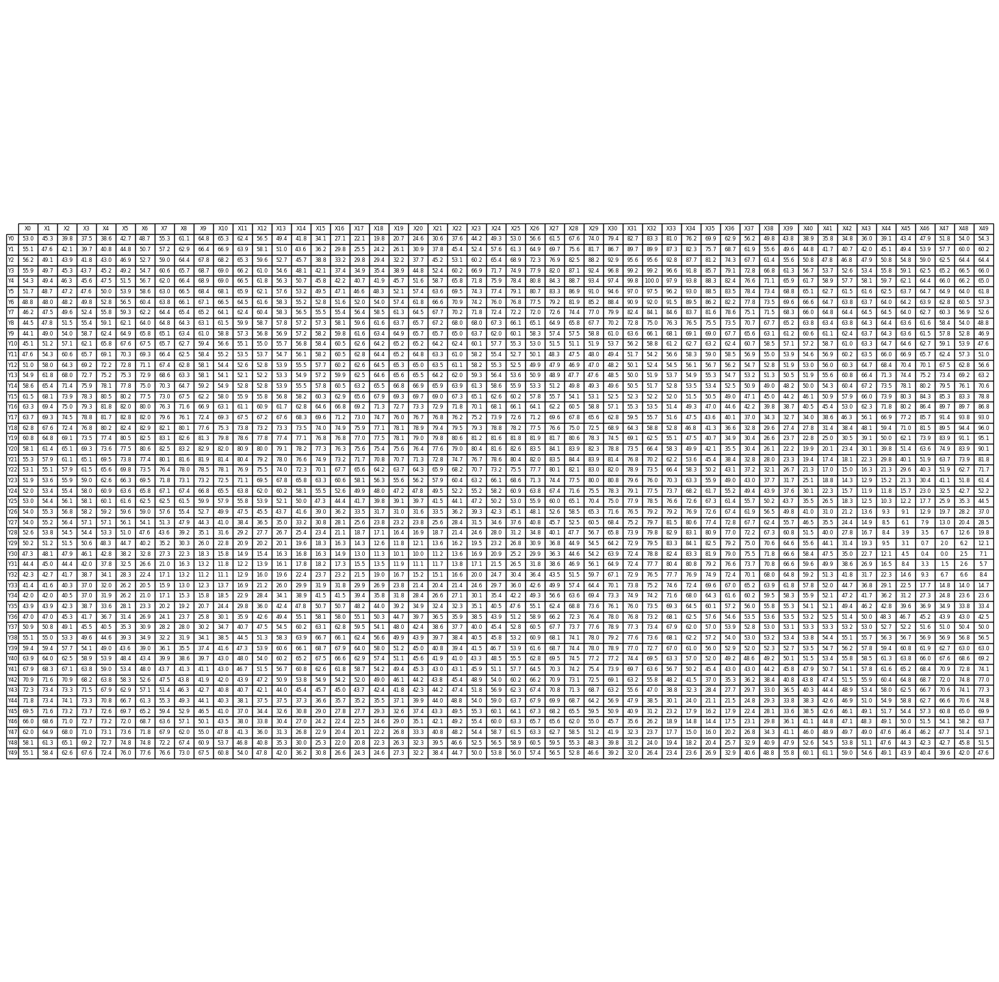

In [3]:
fig, ax = plt.subplots(figsize=(20, 20))
ax.axis("tight")
ax.axis("off")

table = ax.table(cellText=df.values, 
                 colLabels=[f"X{i}" for i in range(size)], 
                 rowLabels=[f"Y{i}" for i in range(size)], 
                 cellLoc="center", 
                 loc="center")

# Adjust table font size for readability
table.auto_set_font_size(True)
table.set_fontsize(6)

plt.show()

### Step 1

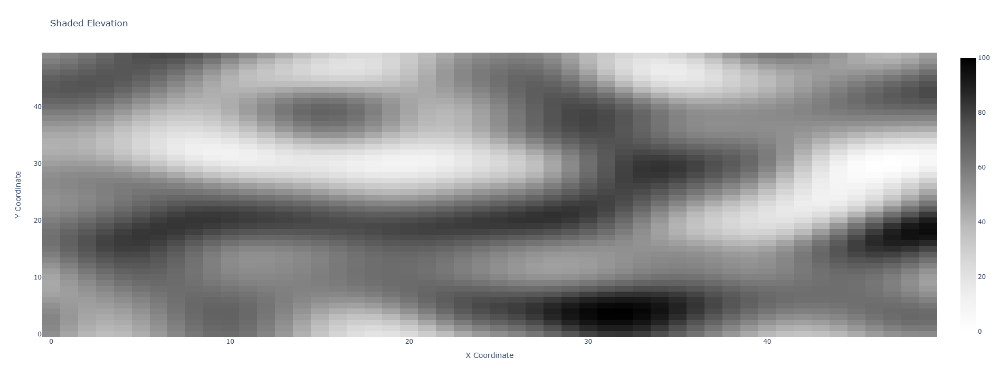

In [4]:
size = elevation.shape[0]

# Create the heat map in plotly
fig = go.Figure(data=go.Heatmap(
    z=elevation,      # Elevation values
    x=np.linspace(0, size-1, size),  # X coordinates (0 to size-1)
    y=np.linspace(0, size-1, size),  # Y coordinates (0 to size-1)
    colorscale='greys'  # Use the 'viridis' color scale
))
# Update the layout with titles and labels
fig.update_layout(
    title="Shaded Elevation",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    coloraxis_colorbar=dict(
        title="Elevation"  # Color bar label
    ),
    width=900,
    height=720
)

# Show the plot
fig.show()

### Now I see it

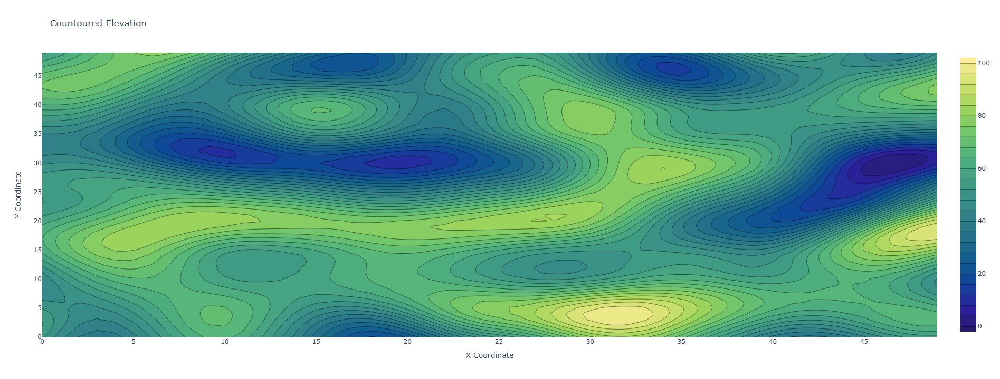

In [5]:

# Create the contour plot in plotly
fig = go.Figure(data=go.Contour(
    z=elevation,      # Elevation values
    x=np.linspace(0, size-1, size),  # X coordinates (0 to size-1)
    y=np.linspace(0, size-1, size),  # Y coordinates (0 to size-1)
    colorscale='haline',  # Use the 'terrain' color scale
    contours=dict(
        start=elevation.min(),  # Set the starting level for contours
        end=elevation.max(),    # Set the ending level for contours
        size=(elevation.max() - elevation.min()) / 25  # Set the contour level spacing
    )
))

# Update the layout with titles and labels
fig.update_layout(
    title="Countoured Elevation",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    coloraxis_colorbar=dict(
        title="Elevation"  # Color bar label
    ),
    width=900,
    height=720
)

# Show the plot
fig.show()

### Man vs Machine

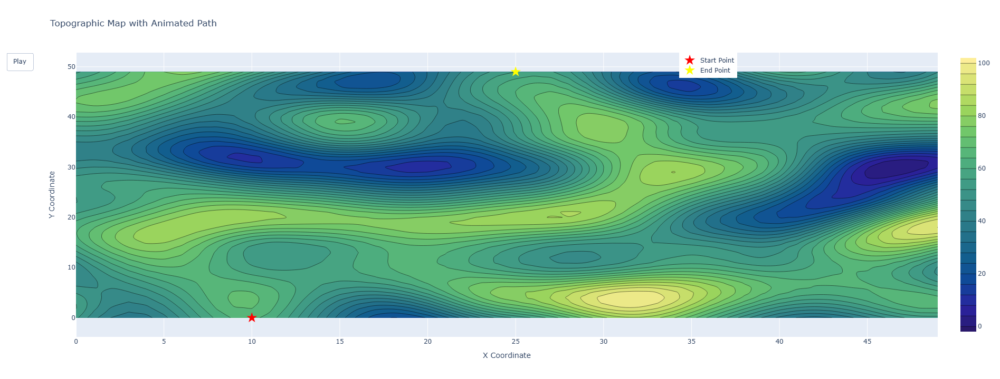

In [6]:
import heapq
import numpy as np
import plotly.graph_objects as go

# Define grid size and Perlin noise elevation data
size = 50
noise = PerlinNoise(octaves=4, seed=42)
elevation = np.zeros((size, size))

for i in range(size):
    for j in range(size):
        elevation[i, j] = noise([i / size, j / size])

elevation = (elevation - np.min(elevation)) / (np.max(elevation) - np.min(elevation)) * 100

# Define start and end points
start_x, start_y = 10, 0
end_x, end_y = 25, size - 1  # y=49 if size=50

# Heuristic function: Manhattan distance
def heuristic(x, y):
    return abs(x - end_x) + abs(y - end_y)

# A* algorithm
def a_star_search(start_x, start_y):
    open_set = []
    heapq.heappush(open_set, (0 + heuristic(start_x, start_y), start_x, start_y))  # (f_cost, x, y)
    
    came_from = {}
    g_costs = { (start_x, start_y): 0 }
    f_costs = { (start_x, start_y): heuristic(start_x, start_y) }

    path_x, path_y = [], []
    
    while open_set:
        _, current_x, current_y = heapq.heappop(open_set)

        # If we reached the destination, reconstruct the path
        if (current_x, current_y) == (end_x, end_y):
            while (current_x, current_y) in came_from:
                path_x.append(current_x)
                path_y.append(current_y)
                current_x, current_y = came_from[(current_x, current_y)]
            path_x.append(start_x)
            path_y.append(start_y)
            return path_x[::-1], path_y[::-1]  # Reverse path for correct order

        # Check all possible neighbors
        for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (1, 1), (-1, 1), (1, -1)]:
            neighbor_x, neighbor_y = current_x + dx, current_y + dy
            if 0 <= neighbor_x < size and 0 <= neighbor_y < size:
                tentative_g_cost = g_costs[(current_x, current_y)] + elevation[neighbor_y, neighbor_x]

                if (neighbor_x, neighbor_y) not in g_costs or tentative_g_cost < g_costs[(neighbor_x, neighbor_y)]:
                    came_from[(neighbor_x, neighbor_y)] = (current_x, current_y)
                    g_costs[(neighbor_x, neighbor_y)] = tentative_g_cost
                    f_costs[(neighbor_x, neighbor_y)] = tentative_g_cost + heuristic(neighbor_x, neighbor_y)
                    heapq.heappush(open_set, (f_costs[(neighbor_x, neighbor_y)], neighbor_x, neighbor_y))

    return [], []  # No path found (shouldn't happen with proper inputs)

# Get the path
path_x, path_y = a_star_search(start_x, start_y)

# Plot the contour map
fig = go.Figure()

# Add the contour plot (elevation map)
fig.add_trace(go.Contour(
    z=elevation,
    x=np.linspace(0, size - 1, size),
    y=np.linspace(0, size - 1, size),
    colorscale='haline',
    contours=dict(
        start=elevation.min(),
        end=elevation.max(),
        size=(elevation.max() - elevation.min()) / 25
    ),
    showscale=True,
    name='Elevation',
    visible=True  # <-- key: keep it always in the base layer
))

# Add visual cues for start and end points
fig.add_trace(go.Scatter(
    x=[start_x], y=[start_y],
    mode='markers',
    marker=dict(size=15, color='red', symbol='star'),
    name='Start Point'
))

fig.add_trace(go.Scatter(
    x=[end_x], y=[end_y],
    mode='markers',
    marker=dict(size=15, color='yellow', symbol='star'),
    name='End Point'
))

# Create animation for the pathfinding process
frames = []

# Add initial frame with only the start and end points visible
frames.append(go.Frame(
    data=[
        go.Scatter(x=[start_x], y=[start_y], mode='markers', marker=dict(size=15, color='red', symbol='star')),
        go.Scatter(x=[end_x], y=[end_y], mode='markers', marker=dict(size=15, color='yellow', symbol='star'))
    ],
    name='frame_0'
))

# Add frames to show each step of the pathfinding
for i in range(1, len(path_x) + 1):
    frames.append(go.Frame(
        data=[
            go.Contour(
                z=elevation,
                x=np.linspace(0, size-1, size),
                y=np.linspace(0, size-1, size),
                colorscale='haline',
                contours=dict(
                    start=elevation.min(),
                    end=elevation.max(),
                    size=(elevation.max() - elevation.min()) / 25
                ),
                showscale=True
            ),
            go.Scatter(
                x=path_x[:i], y=path_y[:i],
                mode='lines',
                line=dict(color='black', width=3),
                marker=dict(size=6, color='white'),
                name='Path (animated)'
            ),
            go.Scatter(
                x=[start_x], y=[start_y],
                mode='markers',
                marker=dict(size=15, color='red', symbol='star'),
                name='Start Point'
            ),
            go.Scatter(
                x=[end_x], y=[end_y],
                mode='markers',
                marker=dict(size=15, color='yellow', symbol='star'),
                name='End Point'
            )
        ],
        name=f'frame_{i}'
    ))

go.Contour(
    z=elevation,
    x=np.linspace(0, size-1, size),
    y=np.linspace(0, size-1, size),
    colorscale='haline',
    contours=dict(
        start=elevation.min(),
        end=elevation.max(),
        size=(elevation.max() - elevation.min()) / 25
    ))
# Set layout options
fig.update_layout(
    title="Topographic Map with Animated Path",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    width=900,
    height=720,
    updatemenus=[dict(
        type='buttons',
        showactive=False,
        buttons=[dict(
            label='Play',
            method='animate',
            args=[None, dict(frame=dict(duration=100, redraw=True), fromcurrent=True)]
        )]
    )],
    # Move the color bar to avoid overlap
    coloraxis_colorbar=dict(
        title="Elevation", 
        x=1.05,  # Position the color bar to the right
        tickvals=[0, 25, 50, 75, 100]
    ),
    # Adjust the layout so that legend items don't overlap
    legend=dict(x=0.7, y=1, traceorder='normal', font=dict(size=12))
)

# Add frames to the figure
fig.frames = frames

# Show the plot
fig.show()

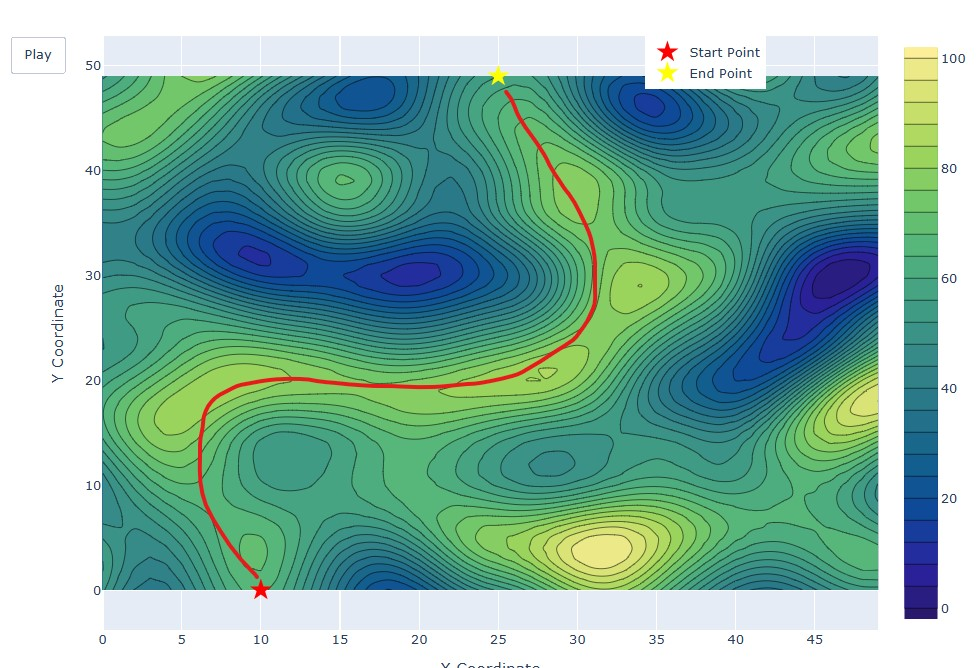

## Anscombe

# Part 2: The Grammar of Graphics

## What Is Encoding?
Encoding is how we turn data into visuals—position, color, size, shape. The way we choose to represent data affects how quickly and clearly people understand it.

## Building a Visualization

### Scaffolding

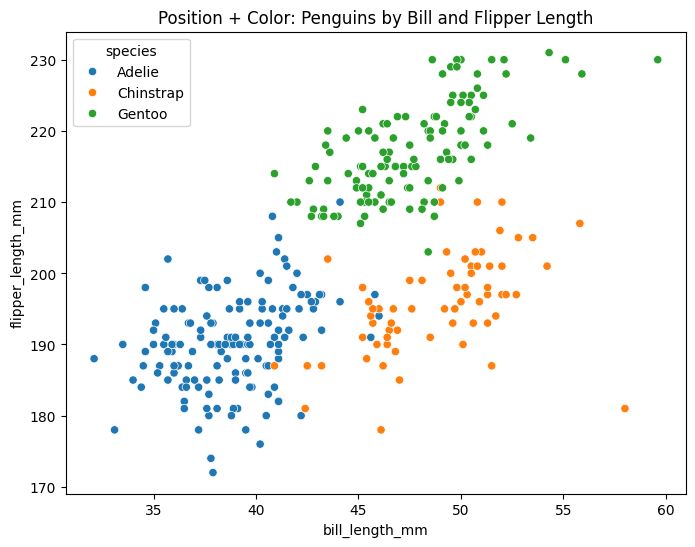

In [11]:
import seaborn as sns
# Load sample dataset
pg = sns.load_dataset("penguins").dropna()

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pg, x="bill_length_mm", y="flipper_length_mm", hue="species")
plt.title("Position + Color: Penguins by Bill and Flipper Length")
plt.show()

### Data Transformations

### Marks and Encodings

C:\Users\darkc\AppData\Local\Temp\ipykernel_23956\389119308.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




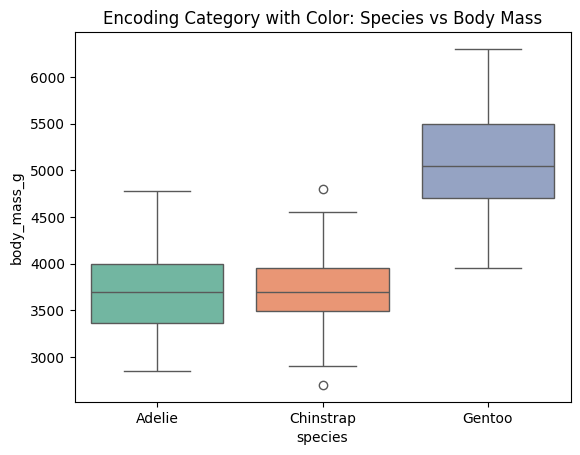

In [13]:
sns.boxplot(data=pg, x="species", y="body_mass_g", palette="Set2")
plt.title("Encoding Category with Color: Species vs Body Mass")
plt.show()

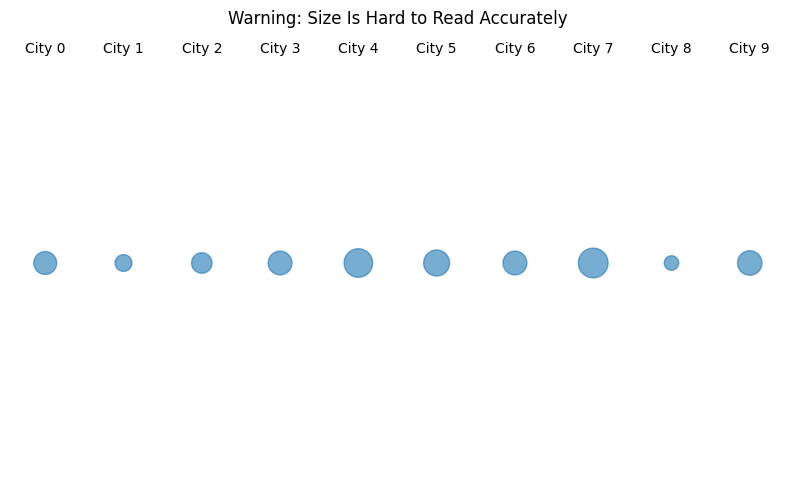

In [14]:
import numpy as np

# Fake data
np.random.seed(0)
revenue = np.random.randint(100, 500, 10)
cities = [f"City {i}" for i in range(10)]

plt.figure(figsize=(10, 6))
plt.scatter(x=np.arange(len(cities)), y=[1]*10, s=revenue, alpha=0.6)
for i, txt in enumerate(cities):
    plt.text(i, 1.05, txt, ha='center')
plt.title("Warning: Size Is Hard to Read Accurately")
plt.axis('off')
plt.show()

# Part 3: Examples in Practice

## Setup

In [7]:
# Parameters for the normal distributions
mean1 = 1
std_dev1 = 1
num_samples1 = 1000

mean2 = 2
std_dev2 = 3
num_samples2 = 1000

# Generate the datasets
data1 = np.random.normal(mean1, std_dev1, num_samples1)
data2 = np.random.normal(mean2, std_dev2, num_samples2)

# Create DataFrames from the datasets
df1 = pd.DataFrame(data1, columns=['Value'])
df2 = pd.DataFrame(data2, columns=['Value'])

## Evaluate 2 Options

In [ ]:
## put the means here and the Pval

## Distributi0ns

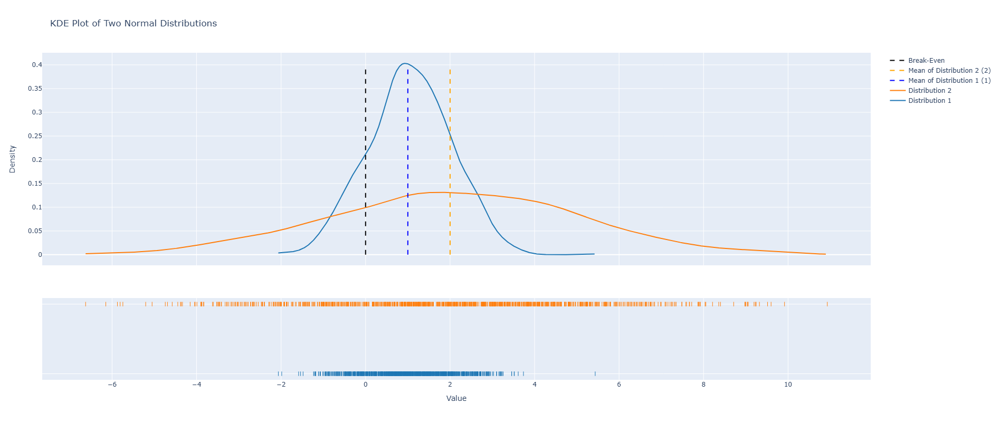

In [8]:
import plotly.figure_factory as ff
# Create KDE plot
fig = ff.create_distplot([data1, data2], group_labels=['Distribution 1', 'Distribution 2'], show_hist=False)

# Add vertical lines for means and break-even
fig.add_trace(go.Scatter(x=[mean1, mean1], y=[0, 0.4], mode='lines', name=f'Mean of Distribution 1 ({mean1})', line=dict(color='blue', dash='dash')))
fig.add_trace(go.Scatter(x=[mean2, mean2], y=[0, 0.4], mode='lines', name=f'Mean of Distribution 2 ({mean2})', line=dict(color='orange', dash='dash')))
fig.add_trace(go.Scatter(x=[0, 0], y=[0, 0.4], mode='lines', name='Break-Even', line=dict(color='black', dash='dash')))

# Customize layout
fig.update_layout(title='KDE Plot of Two Normal Distributions', xaxis_title='Value', yaxis_title='Density')
fig.update_layout(height=800)
# Show plot
fig.show()